<a href="https://colab.research.google.com/github/yrodriguezmd/IceVision_in_the_works/blob/main/IV_models_retinanet%2C_effdet%2C_frcnn_2021_8_22_9am.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!wget https://raw.githubusercontent.com/airctic/icevision/master/install_colab.sh
!bash install_colab.sh

print(torch.__version__)
print(torchvision.__version__)

--2021-08-22 12:21:23--  https://raw.githubusercontent.com/airctic/icevision/master/install_colab.sh
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.110.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1244 (1.2K) [text/plain]
Saving to: ‘install_colab.sh’

install_colab.sh    100%[===================>]   1.21K  --.-KB/s    in 0s      

2021-08-22 12:21:23 (15.5 MB/s) - ‘install_colab.sh’ saved [1244/1244]

Installing icevision + dependencices for CUDA 10
Uninstalling some dependencies to prevent errors
Found existing installation: torchvision 0.10.0+cu102
Uninstalling torchvision-0.10.0+cu102:
  Successfully uninstalled torchvision-0.10.0+cu102
Found existing installation: fastai 1.0.61
Uninstalling fastai-1.0.61:
  Successfully uninstalled fastai-1.0.61
Installing some dependencies to prevent errors
     |██

In [1]:
from icevision.all import *
import icedata
import icevision
print(icevision.__version__)

path = icedata.pets.load_data()

class_map = icedata.pets.class_map()

data_splitter = RandomSplitter([0.8, 0.2])

parser = icedata.pets.parser(data_dir=path)# removed mask

train_records, valid_records = parser.parse(data_splitter)

INFO     - Downloading default `.ttf` font file - SpaceGrotesk-Medium.ttf from https://raw.githubusercontent.com/airctic/storage/master/SpaceGrotesk-Medium.ttf to /root/.icevision/fonts/SpaceGrotesk-Medium.ttf | icevision.visualize.utils:get_default_font:69
INFO     - Downloading mmdet configs | icevision.models.mmdet.download_configs:download_mmdet_configs:31


0B [00:00, ?B/s]

0.8.1


  0%|          | 0/791918971 [00:00<?, ?B/s]

  0%|          | 0/19173078 [00:00<?, ?B/s]

  0%|          | 0/3686 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:136


  0%|          | 0/2948 [00:00<?, ?it/s]

  0%|          | 0/738 [00:00<?, ?it/s]

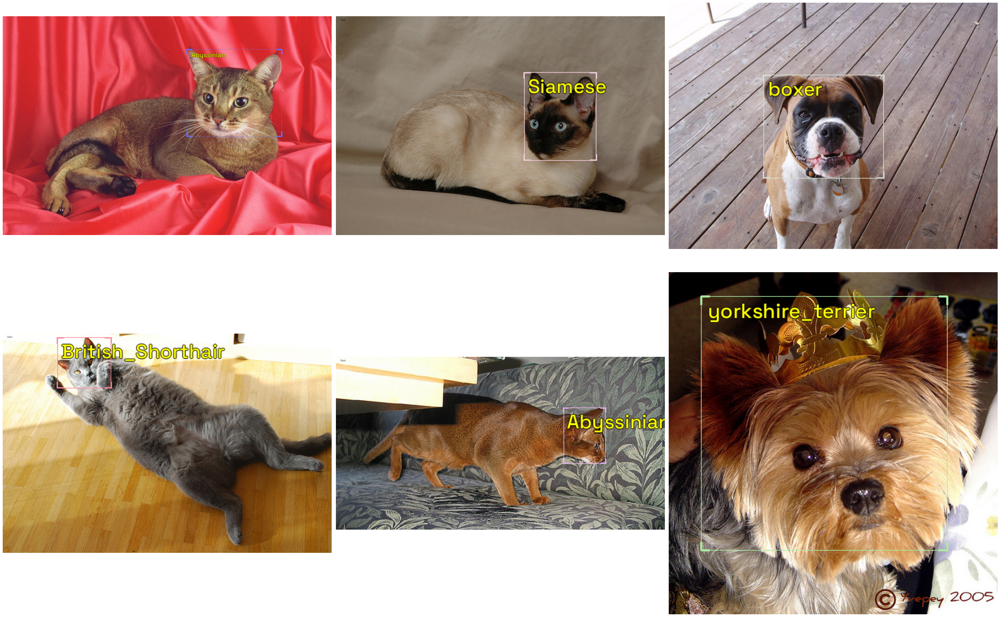

In [2]:
show_records(train_records[3:9], ncols=3, 
             class_map=class_map, show=True,
             #label_color = '#c1c1c7', #whitish purple
             #label_color = '#020303', # black
            label_color = '#ffff00', # yellow
            # label_color = '#0000ff', # blue
              #label_color = '#00ff00', #  green             
             #label_color = '#25ff50', # lt green
             font_size = 30, prettify = False)

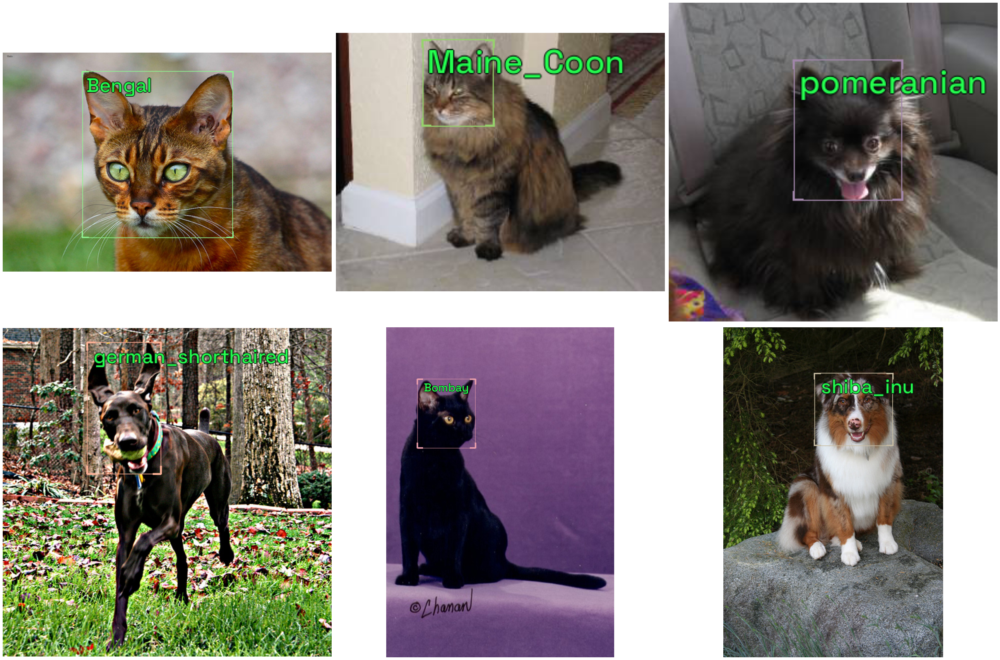

In [14]:
show_records(train_records[16:22], ncols=3, 
             class_map=class_map, show=True,
             #label_color = '#c1c1c7', #whitish purple
             #label_color = '#020303', # black
            #label_color = '#ffff00', # yellow
            # label_color = '#0000ff', # blue
              #label_color = '#00ff00', #  green             
             label_color = '#25ff50', # lt green
             font_size = 30, prettify = False)

In [3]:
image_size = 384
train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=image_size, presize=512), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])

train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

In [4]:
# using retinanet/ resnet50: focal loss
model_type_ret = models.mmdet.retinanet #
backbone_r50 = model_type_ret.backbones.resnet50_fpn_1x(pretrained=True)#
model_ret = model_type_ret.model(backbone=backbone_r50(pretrained=True), #
                      num_classes=len(parser.class_map))


  0%|          | 0/152149505 [00:00<?, ?B/s]

/usr/local/lib/python3.7/dist-packages/mmcv/cnn/utils/weight_init.py:119: UserWarning: init_cfg without layer key, if you do not define override key either, this init_cfg will do nothing
  'init_cfg without layer key, if you do not define override'


Use load_from_local loader
The model and loaded state dict do not match exactly

size mismatch for bbox_head.retina_cls.weight: copying a param with shape torch.Size([720, 256, 3, 3]) from checkpoint, the shape in current model is torch.Size([333, 256, 3, 3]).
size mismatch for bbox_head.retina_cls.bias: copying a param with shape torch.Size([720]) from checkpoint, the shape in current model is torch.Size([333]).


In [5]:
# using ret/res50
train_dl_ret = model_type_ret.train_dl(train_ds, batch_size=16, num_workers=4, shuffle=True)#
valid_dl_ret = model_type_ret.valid_dl(valid_ds, batch_size=16, num_workers=4, shuffle=False)#

SuggestedLRs(lr_min=4.786300996784121e-05, lr_steep=0.0003311311302240938)

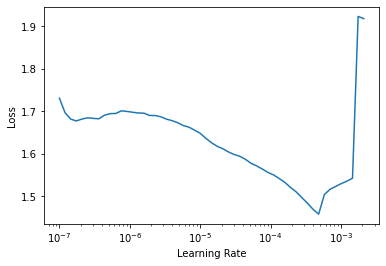

In [6]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

# using ret/r50
learn_ret = model_type_ret.fastai.learner(dls=[train_dl_ret, valid_dl_ret], model=model_ret, metrics=metrics)#
learn_ret.lr_find()#
# use 0.0003

In [8]:
learn_ret.fine_tune(10, 0.0003, freeze_epochs=1) #

epoch,train_loss,valid_loss,COCOMetric,time
0,0.771828,0.743317,0.117450,01:50


epoch,train_loss,valid_loss,COCOMetric,time
0,0.572058,0.501854,0.290760,01:51
1,0.506254,0.453932,0.410181,01:50
2,0.464334,0.413382,0.506678,01:47
3,0.418289,0.382911,0.565091,01:46
4,0.380712,0.378687,0.593414,01:45
5,0.336989,0.290291,0.704598,01:45
6,0.297872,0.289462,0.701307,01:44
7,0.262825,0.240078,0.753191,01:43
8,0.240934,0.237470,0.751170,01:44
9,0.235012,0.240960,0.745094,01:43


In [38]:
## using lr min
learn_ret.fine_tune(10,5e-05 , freeze_epochs=1) #

epoch,train_loss,valid_loss,COCOMetric,time
0,0.253262,0.267642,0.718560,01:37


epoch,train_loss,valid_loss,COCOMetric,time
0,0.235104,0.250493,0.733163,01:46
1,0.224306,0.237070,0.752355,01:45
2,0.218363,0.241913,0.751070,01:45
3,0.206540,0.222419,0.777510,01:44
4,0.205530,0.231175,0.758136,01:44
5,0.193605,0.225118,0.766288,01:45
6,0.187617,0.222407,0.769249,01:45
7,0.188776,0.225020,0.763274,01:45
8,0.183111,0.222204,0.767578,01:44
9,0.183238,0.225029,0.765282,01:44


In [25]:
import matplotlib.pyplot as plt
def plot_metrics(learn, title, x, y):
  plt.plot(L(learn.recorder.values).itemgot())#
  plt.xlabel('epoch')
  plt.ylabel('mAP (green), Loss (blue, orange)')
  plt.title(title)
  plt.text(x, y, 'Legend: mAP(green), train_loss(blue), valid_loss(orange');

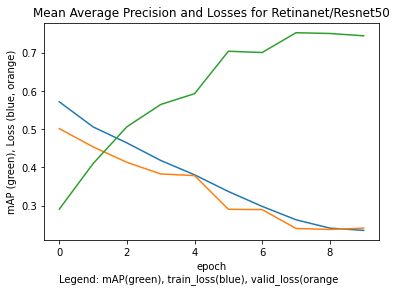

In [32]:
plot_metrics(learn_ret, 'Mean Average Prplot_metrics(learn_ret, 'Mean Average Precision and Losses for Retinanet/Resnet50', 0, 0.1)

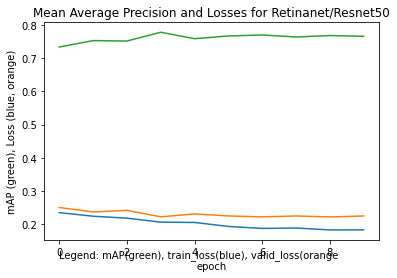

In [39]:
# using lr min
plot_metrics(learn_ret, 'Mean Average Precision and Losses for Retinanet/Resnet50', 0, 0.1)


Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


  0%|          | 0.00/160M [00:00<?, ?B/s]

SuggestedLRs(lr_min=0.0001737800776027143, lr_steep=3.630780702224001e-05)

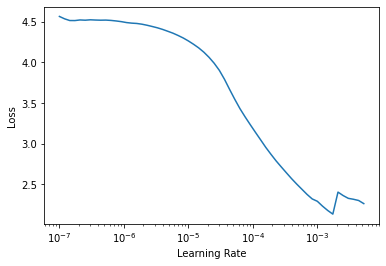

In [11]:
# using faster rcnn
model_type_frcnn = models.torchvision.faster_rcnn ##
#backbone = model_type_ret.backbones.resnet50_fpn_1x(pretrained=True)#
model_frcnn = model_type_frcnn.model( ##
                      num_classes=len(parser.class_map))
train_dl_frcnn = model_type_frcnn.train_dl(train_ds, ##
                      batch_size=16, num_workers=4, shuffle=True)
valid_dl_frcnn = model_type_frcnn.valid_dl(valid_ds, ##
                      batch_size=16, num_workers=4, shuffle=False)
                                       
learn_frcnn = model_type_frcnn.fastai.learner(dls=[train_dl_frcnn, ###
                                                   valid_dl_frcnn], #
                                              model=model_frcnn, metrics=metrics)#
learn_frcnn.lr_find()#

In [12]:
learn_frcnn.fine_tune(10, 0.0003, freeze_epochs=1) #

epoch,train_loss,valid_loss,COCOMetric,time
0,0.350331,0.299377,0.035028,01:50


epoch,train_loss,valid_loss,COCOMetric,time
0,0.261152,0.275059,0.151159,02:50
1,0.233510,0.262334,0.238084,02:46
2,0.195852,0.202935,0.380432,02:46


epoch,train_loss,valid_loss,COCOMetric,time
0,0.261152,0.275059,0.151159,02:50
1,0.233510,0.262334,0.238084,02:46
2,0.195852,0.202935,0.380432,02:46
3,0.158356,0.154310,0.497767,02:47
4,0.137387,0.134495,0.545914,02:46
5,0.122092,0.123419,0.581667,02:46
6,0.109579,0.115726,0.620403,02:46
7,0.098241,0.108860,0.626619,02:45
8,0.088867,0.100129,0.666341,02:46
9,0.088251,0.098613,0.675669,02:45


In [ ]:
# using lr min
learn_frcnn.fine_tune(10, 0.0002, freeze_epochs=1) #

epoch,train_loss,valid_loss,COCOMetric,time
0,0.107124,0.124148,0.567980,01:49


epoch,train_loss,valid_loss,COCOMetric,time
0,0.091448,0.102644,0.657940,02:46
1,0.093884,0.105225,0.632270,02:46
2,0.093948,0.115044,0.600078,02:46
3,0.091622,0.101793,0.627002,02:46
4,0.085935,0.106862,0.627607,02:46
5,0.078688,0.090686,0.693747,02:46
6,0.075339,0.092658,0.682330,02:46
7,0.070157,0.086929,0.706404,02:45
8,0.065423,0.085282,0.701209,02:46


epoch,train_loss,valid_loss,COCOMetric,time
0,0.091448,0.102644,0.657940,02:46
1,0.093884,0.105225,0.632270,02:46
2,0.093948,0.115044,0.600078,02:46
3,0.091622,0.101793,0.627002,02:46
4,0.085935,0.106862,0.627607,02:46
5,0.078688,0.090686,0.693747,02:46
6,0.075339,0.092658,0.682330,02:46
7,0.070157,0.086929,0.706404,02:45
8,0.065423,0.085282,0.701209,02:46


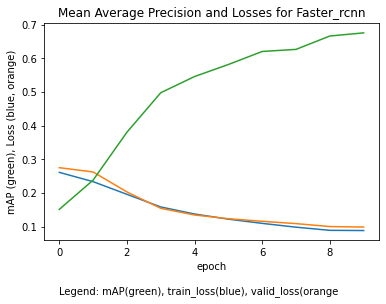

In [31]:
plot_metrics(learn_frcnn, 'Mean Average Precision and Losses for Faster_rcnn', 0,-0.1)

In [ ]:
# using lr min
plot_metrics(learn_frcnn, 'Mean Average Precision and Losses for Faster_rcnn', 0,-0.1)

Downloading: "https://github.com/rwightman/efficientdet-pytorch/releases/download/v0.1/tf_efficientdet_lite0-f5f303a9.pth" to /root/.cache/torch/hub/checkpoints/tf_efficientdet_lite0-f5f303a9.pth


SuggestedLRs(lr_min=0.03630780577659607, lr_steep=2.2908675418875646e-06)

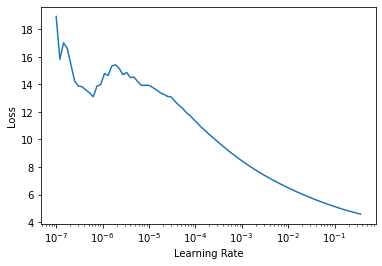

In [15]:
# using efficientdet
model_type_eff = models.ross.efficientdet ##
backbone_eff = model_type_eff.backbones.tf_lite0#
model_eff = model_type_eff.model(backbone = backbone_eff(pretrained=True), ##
                      num_classes=len(parser.class_map),
                      img_size = image_size)#
train_dl_eff = model_type_eff.train_dl(train_ds, ##
                      batch_size=16, num_workers=4, shuffle=True)
valid_dl_eff = model_type_eff.valid_dl(valid_ds, ##
                      batch_size=16, num_workers=4, shuffle=False)
                                       
learn_eff = model_type_eff.fastai.learner(dls=[train_dl_eff, ###
                                                   valid_dl_eff], #
                                              model=model_eff, metrics=metrics)#
learn_eff.lr_find()#

In [16]:
learn_eff.fine_tune(10, 0.01, freeze_epochs=1) #

epoch,train_loss,valid_loss,COCOMetric,time
0,1.429112,1.493515,0.004675,01:19


epoch,train_loss,valid_loss,COCOMetric,time
0,0.922992,0.893611,0.046387,01:26
1,0.802774,0.848991,0.075369,01:26
2,0.726220,0.731929,0.161162,01:23
3,0.677518,0.677820,0.217953,01:22
4,0.617960,0.557102,0.292940,01:22
5,0.570086,0.606423,0.279359,01:22
6,0.532791,0.486698,0.410237,01:23
7,0.498448,0.456548,0.453441,01:24
8,0.460471,0.439109,0.478475,01:23
9,0.452717,0.435466,0.483398,01:23


In [42]:
# using lr min
learn_eff.fine_tune(10, 0.036, freeze_epochs=1) #

epoch,train_loss,valid_loss,COCOMetric,time
0,0.678686,5.974543,0.080845,01:11


epoch,train_loss,valid_loss,COCOMetric,time


epoch,train_loss,valid_loss,COCOMetric,time
0,0.557739,0.619252,0.343679,01:21
1,0.599806,0.717458,0.264156,01:21
2,0.612063,0.975795,0.222119,01:21
3,0.579811,0.724861,0.301818,01:21
4,0.554995,0.586232,0.349167,01:21
5,0.481444,0.464276,0.521509,01:21
6,0.434375,0.421706,0.563850,01:21
7,0.382934,0.378470,0.630278,01:21
8,0.343425,0.331979,0.678627,01:21
9,0.335548,0.334677,0.667094,01:21


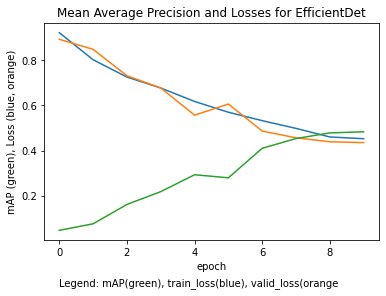

In [35]:
plot_metrics(learn_eff, 'Mean Average Precision and Losses for EfficientDet',0,-0.2)

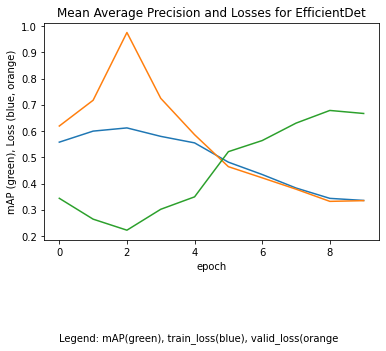

In [43]:
# using lr min
plot_metrics(learn_eff, 'Mean Average Precision and Losses for EfficientDet',0,-0.2)

  0%|          | 0.00/14.1M [00:00<?, ?B/s]

SuggestedLRs(lr_min=0.002754228748381138, lr_steep=1.0964781722577754e-06)

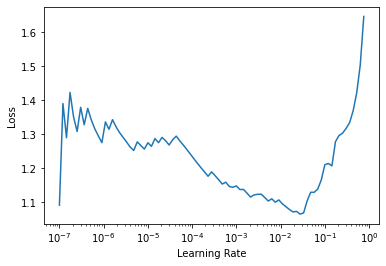

In [36]:
# using YOLOv5
model_type_yolo = models.ultralytics.yolov5 ##
backbone_yolo = model_type_yolo.backbones.small #
model_yolo = model_type_yolo.model(backbone = backbone_yolo(pretrained=True), ###
                      num_classes=len(parser.class_map),
                      img_size = image_size)#
train_dl_yolo = model_type_yolo.train_dl(train_ds, ##
                      batch_size=16, num_workers=4, shuffle=True)
valid_dl_yolo = model_type_yolo.valid_dl(valid_ds, ##
                      batch_size=16, num_workers=4, shuffle=False)
                                       
learn_yolo = model_type_yolo.fastai.learner(dls=[train_dl_yolo, ###
                                                   valid_dl_yolo], #
                                              model=model_yolo, metrics=metrics)#
learn_yolo.lr_find()#

In [ ]:
learn_yolo.fine_tune(10, 0.001, freeze_epochs=1) #

In [ ]:
plot_metrics(learn_yolo, 'Mean Average Precision and Losses for YOLOv5', 0,0)

In [44]:
# using lr_min
learn_yolo.fine_tune(10, 0.0027, freeze_epochs=1) #

epoch,train_loss,valid_loss,COCOMetric,time
0,0.854627,0.969258,0.039731,00:37


epoch,train_loss,valid_loss,COCOMetric,time
0,0.653862,0.749211,0.192780,00:37
1,0.577333,0.705894,0.210156,00:37
2,0.546381,0.620841,0.307988,00:36
3,0.526162,0.584695,0.347578,00:37
4,0.479695,0.569292,0.426040,00:36
5,0.438575,0.517678,0.475892,00:37
6,0.399391,0.455651,0.604193,00:37
7,0.403927,0.429668,0.581877,00:37
8,0.375418,0.413816,0.616862,00:36
9,0.352750,0.413492,0.618225,00:37


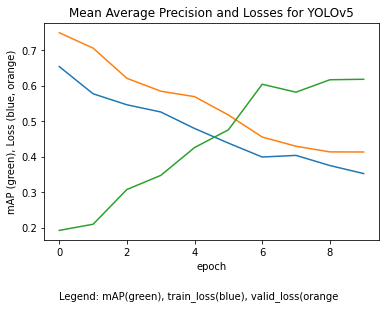

In [45]:
# using lr min
plot_metrics(learn_yolo, 'Mean Average Precision and Losses for YOLOv5', 0,0)

In [ ]:
## duplicate from above
# using lr min
model_type_ret = models.mmdet.retinanet #
backbone_r50 = model_type_ret.backbones.resnet50_fpn_1x(pretrained=True)#
model_ret = model_type_ret.model(backbone=backbone_r50(pretrained=True), #
                      num_classes=len(parser.class_map))

learn_ret.fine_tune(10,5e-05 , freeze_epochs=1) #

epoch,train_loss,valid_loss,COCOMetric,time
0,0.253262,0.267642,0.718560,01:37


epoch,train_loss,valid_loss,COCOMetric,time
0,0.235104,0.250493,0.733163,01:46
1,0.224306,0.237070,0.752355,01:45
2,0.218363,0.241913,0.751070,01:45
3,0.206540,0.222419,0.777510,01:44
4,0.205530,0.231175,0.758136,01:44
5,0.193605,0.225118,0.766288,01:45
6,0.187617,0.222407,0.769249,01:45
7,0.188776,0.225020,0.763274,01:45
8,0.183111,0.222204,0.767578,01:44
9,0.183238,0.225029,0.765282,01:44


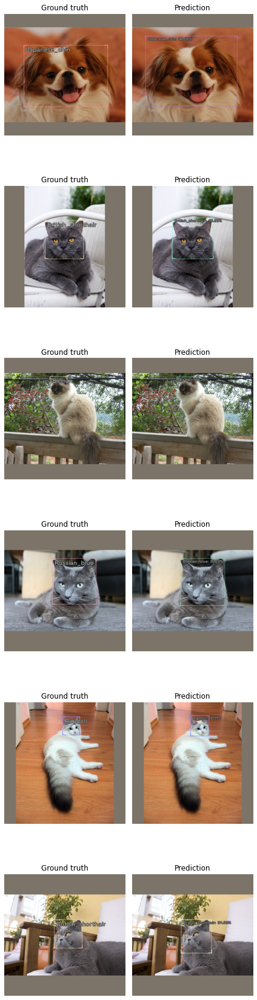

In [48]:
# use best mAP: ret map 0.77
## possible decrease epoch
model_type_ret.show_results(model_ret, valid_ds, 
                 #font_size = 30,  
                 #label_color = '#25ff50', # lt green
)
## fix show_results font size and color

In [56]:
# using string
from icevision.imports import *

from icevision.core import *

from icevision.data import *

from icevision.utils.imageio import *

from icevision.visualize.draw_data import *

from icevision.visualize.utils import *

_end2end_detect('samoyed', 
                model = model_ret,
                transforms = tfms.A.Adapter([*tfms.A.resize_and_pad(size=384), tfms.A.Normalize()]),
                class_map = class_map,
                font_size = 30) # detection threshold = 0.5

NameError: ignored

In [63]:
!pip install bing-image-downloader
from bing_image_downloader import downloader
query_string = 'wiki samoyed'
samo = downloader.download(query_string, limit = 1, 
                            output_dir = 'dataset',
                            adult_filter_off=True,
                            force_replace=False,
                            timeout=60,
                            verbose=True)
samo

[%] Downloading Images to /content/dataset/wiki samoyed


[!!]Indexing page: 1

[%] Indexed 1 Images on Page 1.


[%] Downloading Image #1 from http://upload.wikimedia.org/wikipedia/commons/0/09/Samoyed_on_snow.jpg
[%] File Downloaded !



[%] Done. Downloaded 1 images.

Please show your support here
https://www.buymeacoffee.com/gurugaurav




  0%|          | 0/187537 [00:00<?, ?B/s]

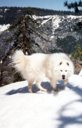

In [64]:
url = ['http://upload.wikimedia.org/wikipedia/commons/0/09/Samoyed_on_snow.jpg']
dest = 'Desktop'
download_url(url[0],dest) #

from PIL import Image

image = Image.open(dest)
image.to_thumb(128)

In [65]:
img = np.array(image)

infer_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size=384), tfms.A.Normalize()])

infer = Dataset.from_images([img], infer_tfms, class_map=class_map )#

preds = model_type_ret.predict(model_ret, infer, keep_images=True)##

show_preds(preds=preds)

## rerun best model, good epoch

TypeError: ignored

In [ ]:
# https://github.com/yrodriguezmd/icevision/blob/master/icevision/models/inference.py
_end2end_detect(sample, font_size = 30) # detection threshold = 0.5